<a href="https://colab.research.google.com/github/manishkolla/Airline-Data-Analysis/blob/main/Airline_Data_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Airline Data Analysis (Data Mining CSC 4740) by Manish Kolla

###Link for the dataset

In [ ]:
#Data Set
'''
Link for the dataset: https://dataverse.harvard.edu/file.xhtml?persistentId=doi:10.7910/DVN/HG7NV7/EIR0RA&version=1.0
'''

##Importing Libraries

In [ ]:
#Importing Libraries
import bz2
import pandas as pd
import bz2
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import scipy
from scipy import stats
from scipy.stats import zscore
import plotly.express as px
import seaborn as sns
from sklearn.cluster import KMeans
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.style as style

##Converting bz2 file to csv format

In [ ]:
#Data Conversion from bz2 to csv
'''
airline = pd.read_csv("2008.csv.bz2", compression='bz2')
airline_db=pd.DataFrame(airline)
airline_db.to_csv("2008.csv")
'''

'\nairline = pd.read_csv("2008.csv.bz2", compression=\'bz2\')\nairline_db=pd.DataFrame(airline)\nairline_db.to_csv("2008.csv")\n'

In [ ]:
#Using the converted CSV file
df=pd.read_csv("2008.csv")
#df=pd.read_csv("/2008.csv")
df=pd.DataFrame(df)

#Understanding the data

In [ ]:
#Size of the data set
print("The shape of the data set is: ", df.shape)

The shape of the data set is:  (624059, 30)


In [ ]:
#first 5 rows of the data set
print(df.head())

   Unnamed: 0    Year  Month  DayofMonth  DayOfWeek  DepTime  CRSDepTime  \
0           0  2008.0    1.0         3.0        4.0   1343.0      1325.0   
1           1  2008.0    1.0         3.0        4.0   1125.0      1120.0   
2           2  2008.0    1.0         3.0        4.0   2009.0      2015.0   
3           3  2008.0    1.0         3.0        4.0    903.0       855.0   
4           4  2008.0    1.0         3.0        4.0   1423.0      1400.0   

   ArrTime  CRSArrTime UniqueCarrier  ...  TaxiIn TaxiOut  Cancelled  \
0   1451.0      1435.0            WN  ...     4.0     9.0        0.0   
1   1247.0      1245.0            WN  ...     3.0     8.0        0.0   
2   2136.0      2140.0            WN  ...     2.0    14.0        0.0   
3   1203.0      1205.0            WN  ...     5.0     7.0        0.0   
4   1726.0      1710.0            WN  ...     6.0    10.0        0.0   

   CancellationCode  Diverted  CarrierDelay  WeatherDelay NASDelay  \
0               NaN       0.0          1

In [ ]:
#number of unique parameters in each attribute
print(df.nunique())

Unnamed: 0           624058
Year                      1
Month                     2
DayofMonth               31
DayOfWeek                 7
DepTime                1394
CRSDepTime             1097
ArrTime                1439
CRSArrTime             1275
UniqueCarrier            20
FlightNum              6974
TailNum                4881
ActualElapsedTime       616
CRSElapsedTime          444
AirTime                 596
ArrDelay                662
DepDelay                636
Origin                  286
Dest                    287
Distance               1327
TaxiIn                  136
TaxiOut                 237
Cancelled                 2
CancellationCode          3
Diverted                  2
CarrierDelay            522
WeatherDelay            362
NASDelay                387
SecurityDelay            70
LateAircraftDelay       399
dtype: int64


In [ ]:
#Data type of each attribute
print(df.dtypes)

Unnamed: 0             int64
Year                 float64
Month                float64
DayofMonth           float64
DayOfWeek            float64
DepTime              float64
CRSDepTime           float64
ArrTime              float64
CRSArrTime           float64
UniqueCarrier         object
FlightNum            float64
TailNum               object
ActualElapsedTime    float64
CRSElapsedTime       float64
AirTime              float64
ArrDelay             float64
DepDelay             float64
Origin                object
Dest                  object
Distance             float64
TaxiIn               float64
TaxiOut              float64
Cancelled            float64
CancellationCode      object
Diverted             float64
CarrierDelay         float64
WeatherDelay         float64
NASDelay             float64
SecurityDelay        float64
LateAircraftDelay    float64
dtype: object


In [ ]:
#Checking for dublicates
df[df.duplicated()]

,Unnamed: 0,Year,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,UniqueCarrier,...,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay


In [ ]:
#Unique Destinations airports in the data set
print(df["Dest"].nunique())
print(df["Dest"].unique())

287
['LIT' 'MAF' 'MCO' 'MDW' 'MSY' 'OAK' 'OKC' 'PHL' 'PHX' 'SAN' 'SAT' 'STL'
 'TPA' 'TUL' 'AUS' 'HOU' 'LAS' 'BWI' 'JAX' 'MCI' 'FLL' 'PBI' 'RSW' 'BHM'
 'BNA' 'IND' 'ORF' 'ABQ' 'ALB' 'AMA' 'BDL' 'BOI' 'BUF' 'BUR' 'CLE' 'CMH'
 'DEN' 'ELP' 'GEG' 'IAD' 'ISP' 'LAX' 'LBB' 'MHT' 'OMA' 'ONT' 'PDX' 'PIT'
 'PVD' 'RDU' 'RNO' 'SDF' 'SEA' 'SFO' 'SJC' 'SLC' 'SMF' 'SNA' 'TUS' 'DAL'
 'DTW' 'JAN' 'HRL' 'CRP' 'EWR' 'IAH' 'XNA' 'DCA' 'GSO' 'ROC' 'MYR' 'SYR'
 'ATL' 'SAV' 'RIC' 'COS' 'FAT' 'MRY' 'LGB' 'BFL' 'EUG' 'ICT' 'MSN' 'CAE'
 'DAY' 'BTR' 'TLH' 'DFW' 'LFT' 'PWM' 'SHV' 'MKE' 'CHS' 'CRW' 'HSV' 'TYS'
 'MTJ' 'MGM' 'MFE' 'MSP' 'GSP' 'GRR' 'MEM' 'BTV' 'CLT' 'BRO' 'CVG' 'LGA'
 'VPS' 'LEX' 'BPT' 'PNS' 'ORD' 'ABE' 'LRD' 'BGR' 'GRK' 'SRQ' 'LCH' 'AEX'
 'AVL' 'GPT' 'MLU' 'MOB' 'BOS' 'DSM' 'CHA' 'CLL' 'PSP' 'DAB' 'ILM' 'JFK'
 'MDT' 'ASE' 'COD' 'CPR' 'DRO' 'EGE' 'GJT' 'HDN' 'RAP' 'ITO' 'KOA' 'LIH'
 'OGG' 'ROA' 'SPI' 'HNL' 'MFR' 'SBA' 'SBP' 'YUM' 'ATW' 'AVP' 'BMI' 'CAK'
 'CID' 'CWA' 'FSD' 'FWA' 'GRB' 'LAN' 'MBS' 'SBN

#Data Cleaninig

In [ ]:
#Checking for null values and replacing them with the mean value of that column
print("The number of empty values in each column are:")
print(df.isnull().sum())
for x in df.columns:
  try:
    mean_column=df[x].mean()
  except:
    mean_column=0
  df[x] = df[x].fillna(mean_column)
print("The number of empty values in each column are:")
print(df.isnull().sum())


The number of empty values in each column are:
Unnamed: 0                0
Year                      1
Month                     1
DayofMonth                1
DayOfWeek                 1
DepTime               18180
CRSDepTime                1
ArrTime               19699
CRSArrTime                1
UniqueCarrier             1
FlightNum                 1
TailNum               10824
ActualElapsedTime     19699
CRSElapsedTime          107
AirTime               19699
ArrDelay              19699
DepDelay              18180
Origin                    1
Dest                      1
Distance                  1
TaxiIn                19699
TaxiOut               18180
Cancelled                 1
CancellationCode     605880
Diverted                  1
CarrierDelay         469790
WeatherDelay         469790
NASDelay             469790
SecurityDelay        469790
LateAircraftDelay    469790
dtype: int64
The number of empty values in each column are:
Unnamed: 0           0
Year                 0
Month  

<Axes: >

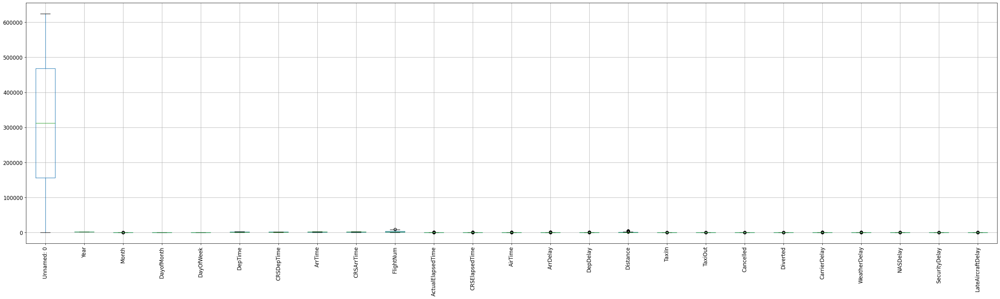

In [ ]:
#Plotting box plot and checking for outliers
# Remvoving outliers can also remove important departure and arrival delays which large numbers, due to which we are not removing
df.boxplot(figsize=(40,10), rot=90,fontsize="large" )

#Analysis based on Statistical Conclusions

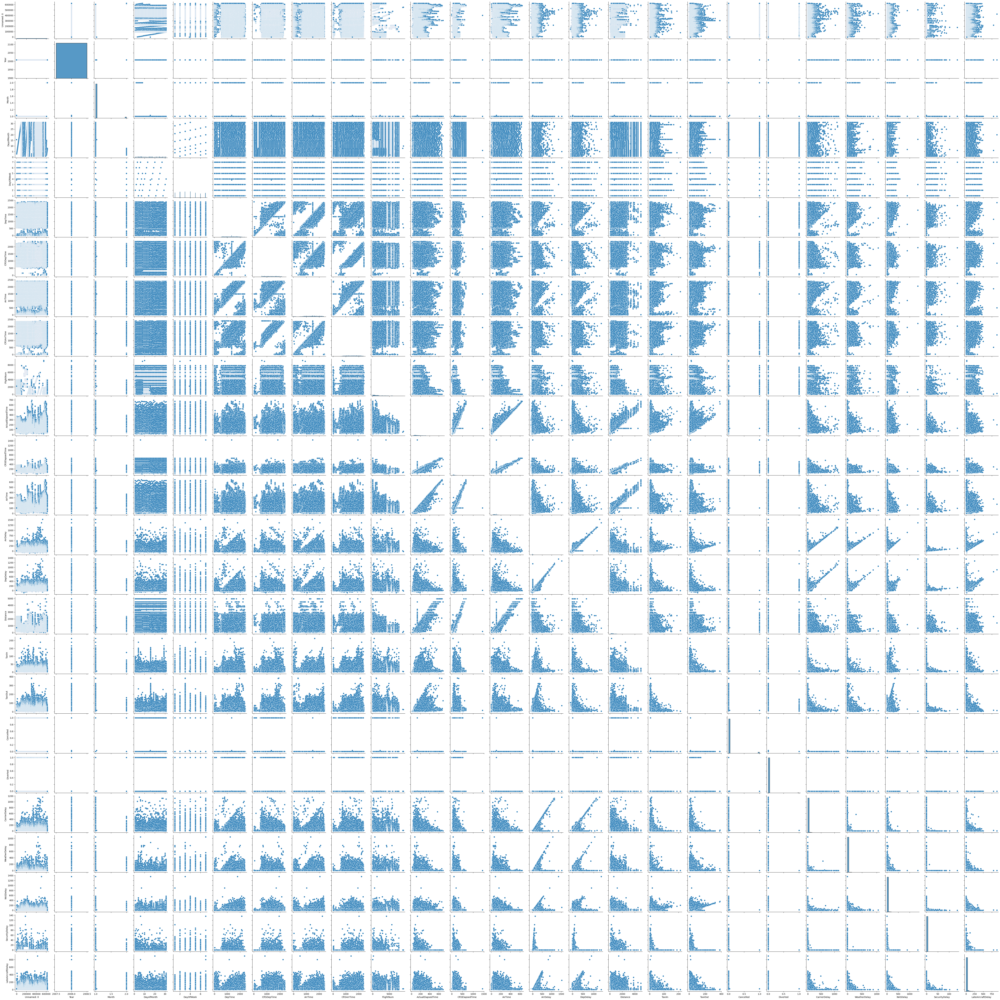

In [ ]:
#Finding the relationship any two variables in the dataset using pairplot
sns.pairplot(data=df)

<Axes: >

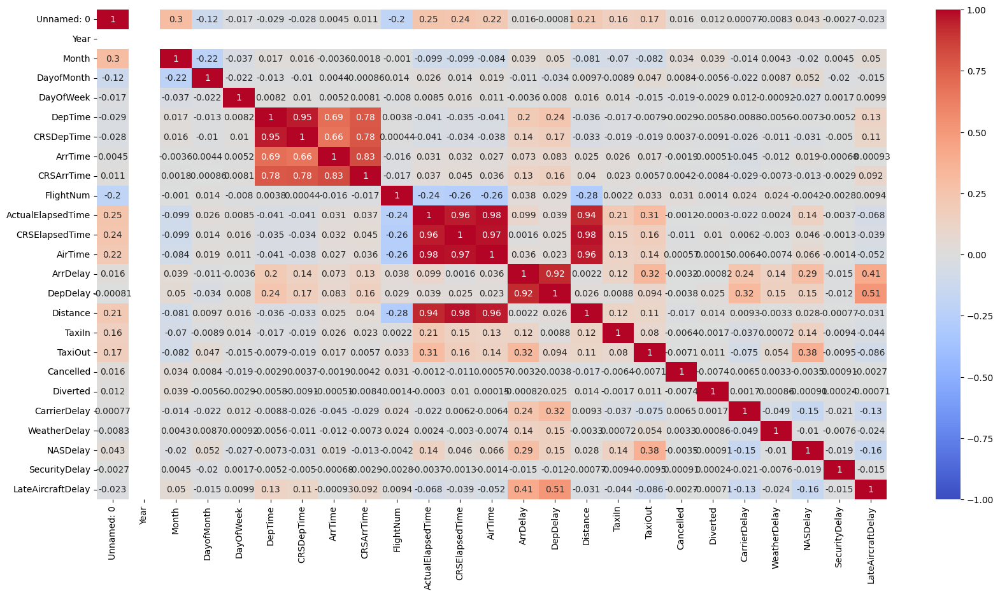

In [ ]:
#heatmap of corellation amoung variables
plt.figure(figsize=(20,10))
sns.heatmap(df.corr(),annot=True,cmap="coolwarm", vmin=-1)

In [ ]:
new_df=df[["CRSDepTime", "CRSArrTime", "AirTime","Distance","ArrDelay", "DepDelay","Distance", "DayofMonth", "DayOfWeek"]]
print("Correlation")
print(new_df.corr())

Correlation
            CRSDepTime  CRSArrTime   AirTime  Distance  ArrDelay  DepDelay  \
CRSDepTime    1.000000    0.794762 -0.025588 -0.015841  0.103292  0.129936   
CRSArrTime    0.794762    1.000000  0.038039  0.042030  0.097154  0.122798   
AirTime      -0.025588    0.038039  1.000000  0.962498  0.012870  0.009654   
Distance     -0.015841    0.042030  0.962498  1.000000 -0.017236  0.011022   
ArrDelay      0.103292    0.097154  0.012870 -0.017236  1.000000  0.928404   
DepDelay      0.129936    0.122798  0.009654  0.011022  0.928404  1.000000   
Distance     -0.015841    0.042030  0.962498  1.000000 -0.017236  0.011022   
DayofMonth   -0.008331   -0.001748  0.005237 -0.003906 -0.009844 -0.029346   
DayOfWeek     0.008046    0.005584  0.012171  0.017323 -0.013423 -0.003093   

            Distance  DayofMonth  DayOfWeek  
CRSDepTime -0.015841   -0.008331   0.008046  
CRSArrTime  0.042030   -0.001748   0.005584  
AirTime     0.962498    0.005237   0.012171  
Distance    1.000000   

In [ ]:
#Some AnecAnecdotal Conclusions based on correlation measures from the heatmap
'''
Scheduled Departure(CRS) and the Air Time are negatively correlated which means long hour flights are likely to be schedules in the
early mornings compared to at night

As the distance increases the arrival delay decreases and departture delays increase
more the distance between the airports lesser is the arrival delay and more the departure delays
Long Flights tend to have fewer delays
and also
Long distance flights are likey to to scheduled in the beginning of the month


As the week day increases the arrival delays decreases, which means first half of the week(Monday-Wednesday/Thursday)
tend to have more delays compared to weekends
Weekends is the best time to to fly to avoid any kind of arrival delays
similarly, 
month ends tend to have less departure delays and arrival delays

Flights scheduled in the begining of the week are likey to get more cancelled compared to the ones over the weekend

'''

'\nScheduled Departure(CRS) and the Air Time are negatively correlated which means long hour flights are likely to be schedules in the\nearly mornings compared to at night\n\nAs the distance increases the arrival delay decreases and departture delays increase\nmore the distance between the airports lesser is the arrival delay and more the departure delays\nLong Flights tend to have fewer delays\nand also\nLong distance flights are likey to to scheduled in the beginning of the month\n\n\nAs the week day increases the arrival delays decreases, which means first half of the week(Monday-Wednesday/Thursday)\ntend to have more delays compared to weekends\nWeekends is the best time to to fly to avoid any kind of arrival delays\nsimilarly, \nmonth ends tend to have less departure delays and arrival delays\n\nFlights scheduled in the begining of the week are likey to get more cancelled compared to the ones over the weekend\n\n'

In [ ]:
#Grouping the data set by origin and findig the mean values of delays
mean_df=df[['Origin','Dest','DepDelay','ArrDelay','AirTime','CarrierDelay','WeatherDelay','NASDelay']].copy()
#mean_df.groupby("Origin").mean()
mean_df.groupby('Origin').mean().sort_values(['DepDelay'],ascending=False)

<ipython-input-68-522c066612e7>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mean_df.groupby('Origin').mean().sort_values(['DepDelay'],ascending=False)


,DepDelay,ArrDelay,AirTime,CarrierDelay,WeatherDelay,NASDelay
Origin,,,,,,
SFO,28.346198,26.933318,134.543684,15.887028,3.261408,14.495748
ORD,26.241166,25.816630,110.427868,15.733253,3.921367,14.768303
MKE,19.867587,22.170286,71.793150,16.097542,4.144761,21.435523
OMA,19.756621,20.719130,89.999963,13.377030,3.097196,21.193783
RNO,19.106591,20.270761,63.446700,13.333080,2.722196,18.288055
MDW,16.898636,14.156744,104.316193,15.445805,3.242153,14.618909
MIA,16.618432,16.284192,138.466237,17.867893,2.306721,16.228465
LAX,15.467530,13.505161,114.499297,15.371368,2.453321,16.232995
CMH,15.255718,16.608372,61.147060,13.877925,2.374898,20.113816


#Data Mining

###Removing airports with minimal amount of data rows

In [ ]:
#Since there are many airports data, removing of airports with minimal amount of data can help in making more concrete evidences
origin_mean=df["Origin"].value_counts().mean()
origin=df["Origin"].value_counts()
print(origin)
for val,val2 in zip(origin.values,origin.index):
  if val<origin_mean:
    df = df.drop(df[df['Origin'] == val2].index)

origin_mean=df["Dest"].value_counts().mean()
origin=df["Dest"].value_counts()
print(origin)
for val3,val4 in zip(origin.values,origin.index):
  if val3<origin_mean:
    df = df.drop(df[df['Dest'] == val4].index)

ATL    33906
ORD    29936
DFW    23861
DEN    19811
LAX    19538
       ...  
ALO       27
PLN       24
TUP       10
ADK        9
0          1
Name: Origin, Length: 287, dtype: int64
ATL    20082
ORD    18583
LAX    16270
PHX    16102
LAS    15293
       ...  
BLI       31
CMX       31
ALO       27
PLN       25
TUP        9
Name: Dest, Length: 274, dtype: int64


###Concentrating Destination and Origin: Airroute

In [ ]:
# Making a new column for air route by concenating the column Destination and Origin
airports=[]
for d,o in zip(df["Dest"],df['Origin']):
  airports.append(d+o)
df.insert(20,"Airports", airports)

In [ ]:
#Removing the air routes with fewer amount of data rows for concrete evidences
air=df["Airports"].value_counts()
m=df['Airports'].value_counts().mean()
for val1,val2 in zip(air.values,air.index):
  if val1<m:
    df=df.drop(df[df['Airports'] == val2].index)

###Airroutes and their mean delays

In [ ]:
#Calculating mean delays of the airroutes by grouping
mean_df2=df[['Airports','DepDelay','ArrDelay','AirTime','CarrierDelay','WeatherDelay','NASDelay']].copy()
#mean_df.groupby("Origin").mean()
mean_df2.groupby('Airports').mean().sort_values(['DepDelay'],ascending=False).head(10)

,DepDelay,ArrDelay,AirTime,CarrierDelay,WeatherDelay,NASDelay
Airports,,,,,,
MIAORD,40.272220,37.649376,148.851366,20.223732,7.259374,12.226005
SFOSLC,39.525611,53.870760,104.173090,15.626506,5.192242,36.427390
ORDMIA,38.071453,43.442747,170.342938,14.668851,1.294288,30.294754
SLCSFO,37.592108,41.193208,84.331937,21.838221,1.808368,13.345997
ORDSFO,37.406674,34.457821,210.255347,14.980964,2.899186,23.829374
SFORNO,37.113416,44.806490,56.096307,11.010549,2.161919,36.777977
DFWSFO,36.734411,29.315295,166.137524,18.212867,2.259888,17.060509
CMHORD,36.339325,39.280033,50.807530,20.367473,4.411063,14.031323
EWRORD,35.973960,29.161030,97.533112,12.471709,3.881060,18.261432


In [ ]:
mean_df2.groupby('Airports').mean().sort_values(['DepDelay'],ascending=False).tail(10)

,DepDelay,ArrDelay,AirTime,CarrierDelay,WeatherDelay,NASDelay
Airports,,,,,,
LAXHNL,1.676744,0.637209,288.488372,14.916277,2.445445,15.883685
DTWBOS,1.631923,0.144185,105.357295,13.993000,2.453846,15.253437
CLTDCA,1.528321,3.227334,65.229553,13.431728,2.391045,16.844259
PHXSAT,1.178054,1.740848,130.679370,14.472741,2.547647,15.983306
LGADCA,1.035991,-0.043264,49.994992,13.654646,2.529222,19.365008
RSWBOS,0.731605,-2.060812,188.767190,15.022439,2.483113,16.944277
DTWIND,0.683790,1.926016,47.139440,16.195030,2.451881,15.938278
DCALGA,0.586927,-3.514650,48.718532,14.313110,2.677685,16.018442
CLTJAX,-0.257152,-3.232153,58.775346,14.658431,2.602690,16.493327


#Data Visualization

###Plotting with Minimum Departure Delays

In [ ]:
#Taking the least 1000 values of Departure delays to caluclate early arrivals
min_dep_delay=df.nsmallest(1000,'DepDelay')

In [ ]:
#Fidning the value counts of each unique item in the column of Air routes
print(min_dep_delay["Airports"].value_counts().head(10))

LAXHNL    17
SEASAN    16
LAXPHX    16
SNAOAK    13
PDXSJC    13
CLTIAD    13
SEALAS    12
SEASNA    12
PDXLAS    12
PHXLAS    11
Name: Airports, dtype: int64


In [ ]:
print(min_dep_delay["Dest"].value_counts())

ATL    78
LAX    75
SEA    73
ORD    66
DEN    59
PHX    57
IAH    48
PDX    47
DTW    40
CLT    39
EWR    33
LAS    30
SFO    26
MCO    24
SNA    23
JFK    23
OAK    21
IAD    20
BOS    18
SLC    18
MKE    14
LGA    13
MSP    13
PHL    13
DAL    12
DFW    10
DCA     9
PBI     9
CLE     8
MCI     8
SJC     8
FLL     8
CVG     7
BWI     5
BNA     5
SMF     5
PIT     5
AUS     4
RSW     4
TUS     4
IND     3
SAN     3
TPA     2
CMH     2
JAX     2
MEM     1
BUF     1
ABQ     1
RDU     1
SAT     1
SDF     1
Name: Dest, dtype: int64


#### Origin vs Departure Delays

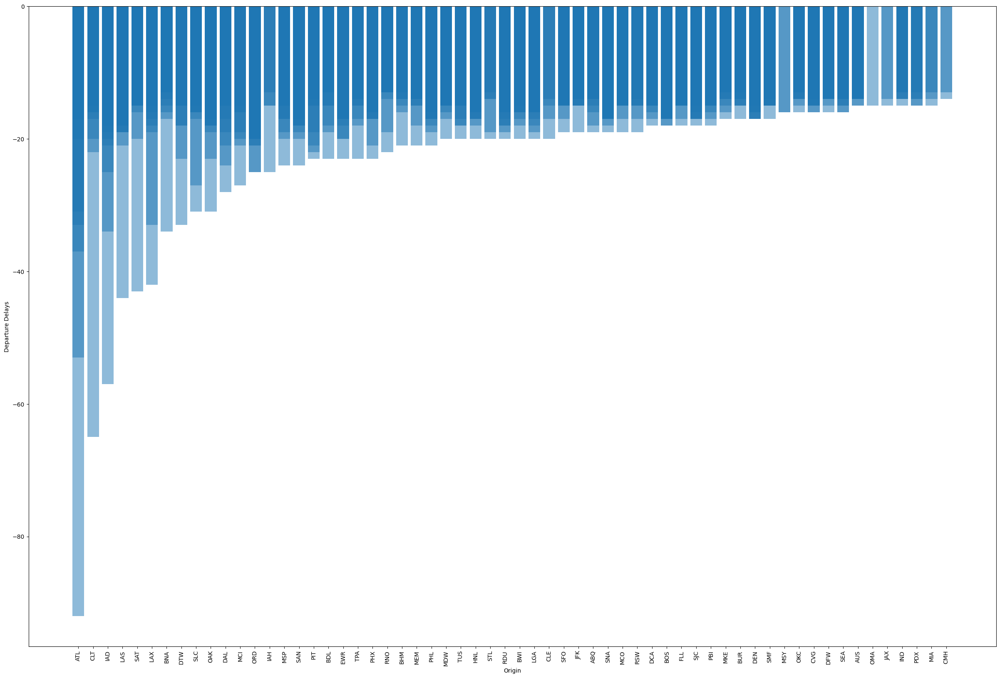

In [ ]:
#Plotting the bar plot amoung minimum departure delays and origin
plt.figure(figsize=(30,20))
plt.bar(min_dep_delay['Origin'],min_dep_delay['DepDelay'],alpha=0.5)
plt.xticks(rotation=90)
plt.xlabel("Origin")
plt.ylabel("Departure Delays")
plt.show()

#### Destination vs Arrival Delays

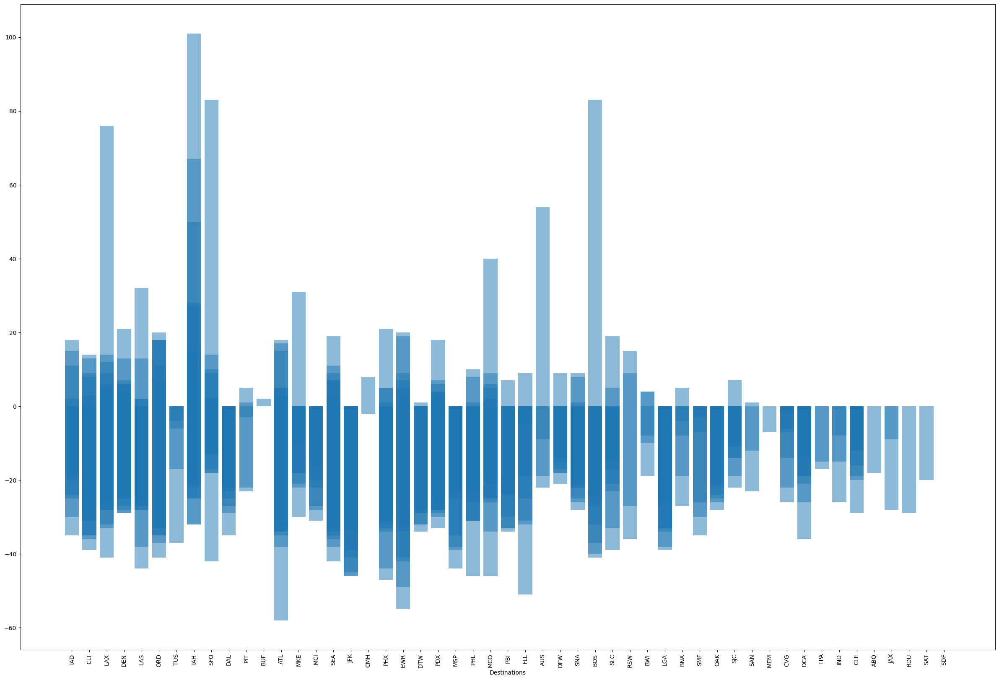

In [ ]:
#Plotting the bar plot amoung minimum arrival delays and destination
plt.figure(figsize=(30,20))
plt.bar(min_dep_delay['Dest'],min_dep_delay['ArrDelay'],alpha=0.5)
plt.xticks(rotation=90)
plt.xlabel("Destinations")
#plt.legend(["Airports", "Departure Delays"])
plt.show()
print()

####Air routes vs Departure and Arrival Delays

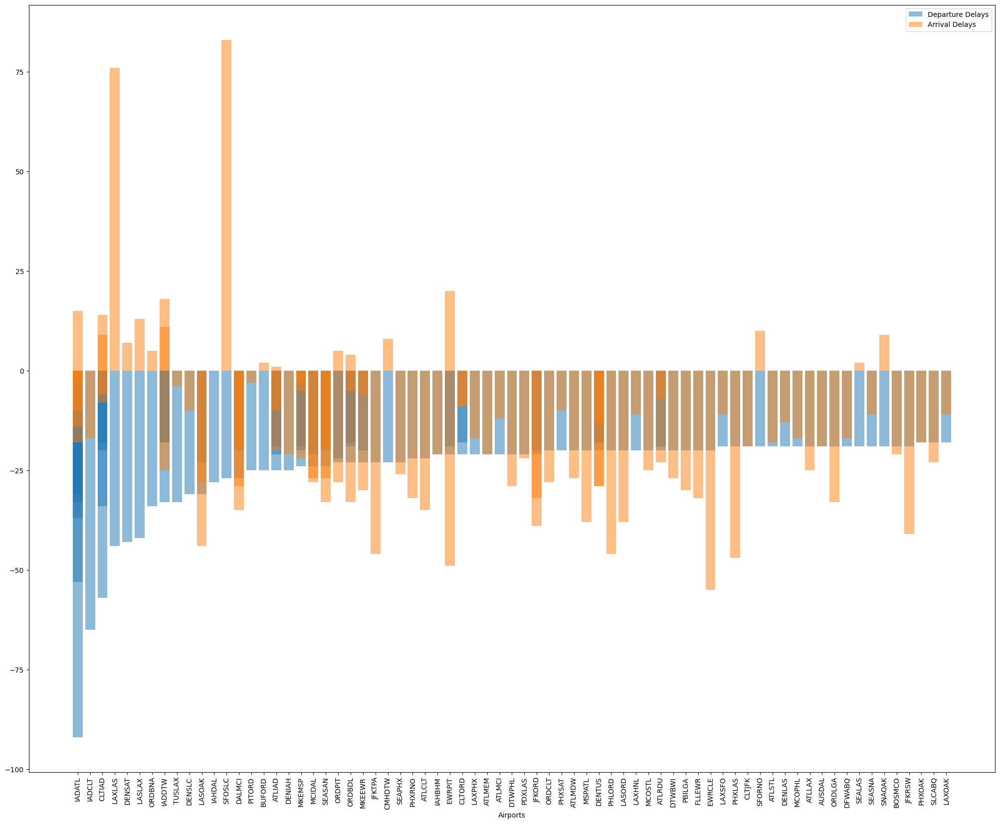

In [ ]:
#Plotting the graph with minimum departure delays and arrival delays with air routes 
min_dep_delay2=df.nsmallest(100,'DepDelay')
plt.figure(figsize=(25,20))
plt.bar(min_dep_delay2['Airports'],min_dep_delay2['DepDelay'],alpha=0.5)
plt.bar(min_dep_delay2['Airports'],min_dep_delay2['ArrDelay'],alpha=0.5)
plt.xticks(rotation=90)
plt.xlabel("Airports")
plt.legend(["Departure Delays", "Arrival Delays"])
plt.show()


### Plotting with maximum departure delays

In [ ]:
#Taking the higest 1000 values of Departure delays to caluclate late departures
max_dep_delay=df.nlargest(1000,'DepDelay')

In [ ]:
#value COunts of air routes in the max departure delays data set
#pd.set_option("display.max_rows", None)
print(max_dep_delay["Airports"].value_counts().head(10))

LAXSFO    14
SFOLAX    12
LASSFO    11
SEASFO    11
SFOLAS    11
ORDEWR    10
LGAORD    10
EWRORD    10
ORDDFW    10
SANSFO    10
Name: Airports, dtype: int64


In [ ]:
#value COunts of destinations in the max departure delays data set
pd.set_option("display.max_rows", None)
print(max_dep_delay["Dest"].value_counts())

ORD    162
SFO     63
ATL     56
DEN     56
LAX     55
LAS     50
EWR     33
IAH     32
DFW     31
PHX     28
SLC     26
SEA     26
JFK     23
PHL     21
MDW     21
SAN     20
BOS     19
CLT     17
LGA     17
MCO     17
MIA     14
DTW     13
PDX     11
SJC     10
IAD     10
CMH     10
MSP      9
MSY      8
MCI      8
OAK      7
FLL      7
BWI      7
CLE      6
MEM      6
STL      6
CVG      6
SNA      6
SMF      5
BNA      5
BUF      5
RNO      5
HOU      5
DAL      4
TPA      4
TUL      4
RDU      4
MKE      3
TUS      3
ABQ      3
BDL      3
SJU      3
DCA      3
PIT      3
ONT      3
OMA      3
SAT      2
PBI      2
SDF      2
AUS      2
BUR      2
ELP      2
PVD      1
IND      1
JAX      1
Name: Dest, dtype: int64


In [ ]:
print(max_dep_delay["Origin"].unique())

['DEN' 'SNA' 'MIA' 'MKE' 'DCA' 'ATL' 'DFW' 'MCO' 'CLE' 'BHM' 'PHX' 'CVG'
 'SFO' 'MDW' 'ORD' 'SAN' 'BNA' 'SMF' 'MSP' 'EWR' 'IAH' 'DAL' 'LAX' 'OMA'
 'OAK' 'IND' 'LAS' 'JAX' 'PIT' 'DTW' 'MSY' 'TPA' 'MEM' 'CLT' 'SAT' 'MCI'
 'RDU' 'CMH' 'OKC' 'SLC' 'BWI' 'SJC' 'SEA' 'STL' 'FLL' 'PDX' 'HOU' 'PHL'
 'JFK' 'BUR' 'LGA' 'AUS' 'IAD' 'RNO' 'RSW' 'ABQ' 'PBI' 'BOS' 'TUS' 'ONT'
 'HNL' 'BDL']


#### Origin vs Departure Delay

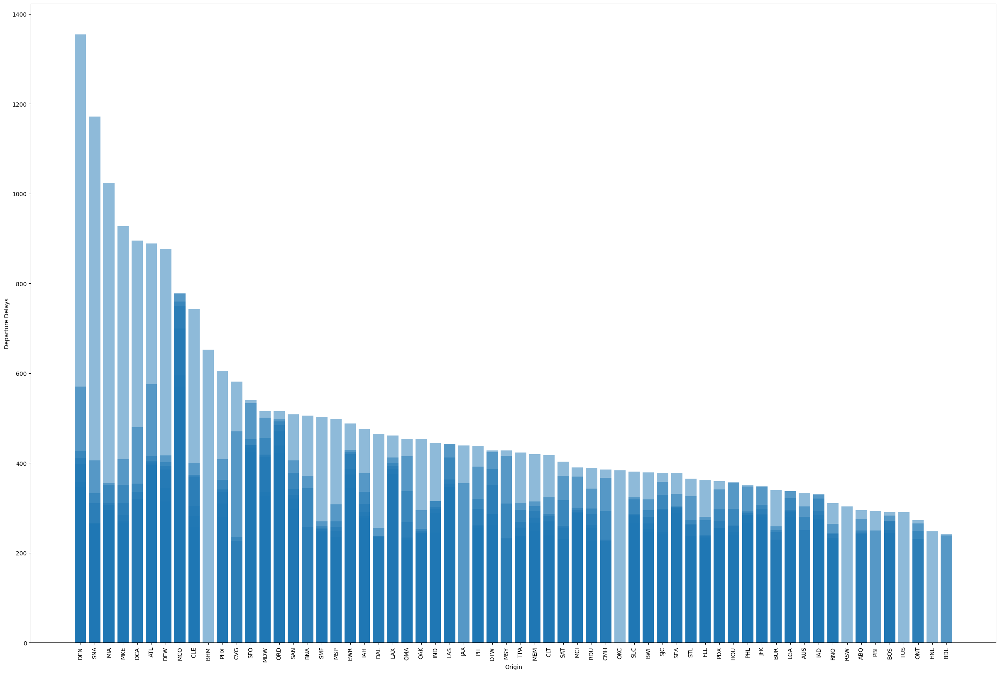

In [ ]:
#Plotting max departure delays with origin
plt.figure(figsize=(30,20))
plt.bar(max_dep_delay['Origin'],max_dep_delay['DepDelay'],alpha=0.5)
plt.xticks(rotation=90)
plt.xlabel("Origin")
plt.ylabel("Departure Delays")
plt.show()

####Destination vs Arrival Delay

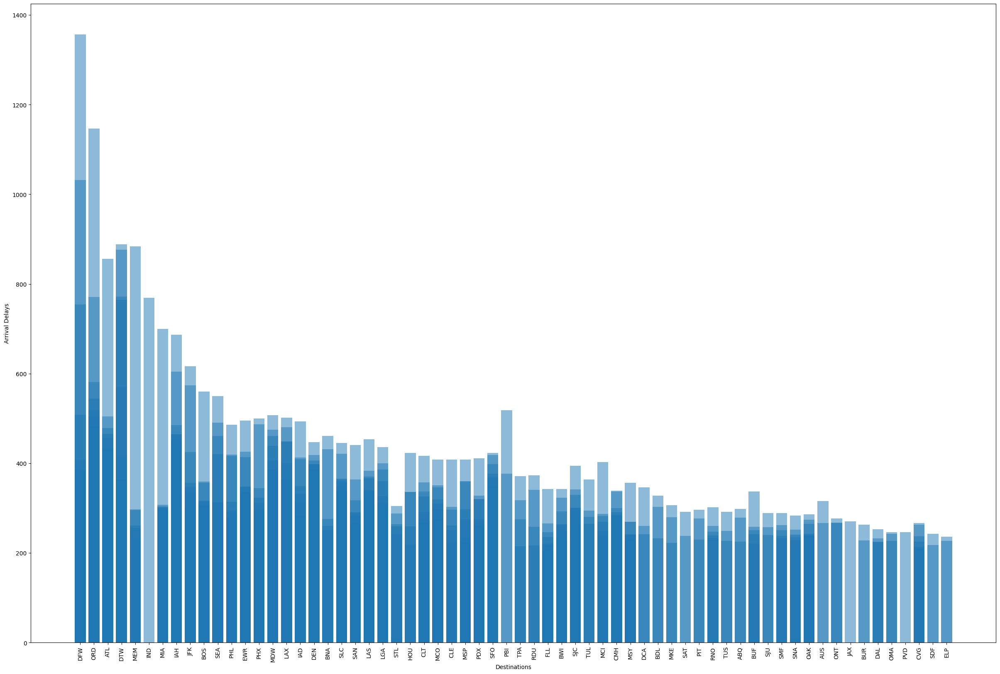

In [ ]:
#Plotting max arrival delays with destination
plt.figure(figsize=(30,20))
plt.bar(max_dep_delay['Dest'],max_dep_delay['ArrDelay'],alpha=0.5)
plt.xticks(rotation=90)
plt.xlabel("Destinations")
plt.ylabel("Arrival Delays")
plt.show()
print()

#### Air routes vs Departure and Arrival Delay

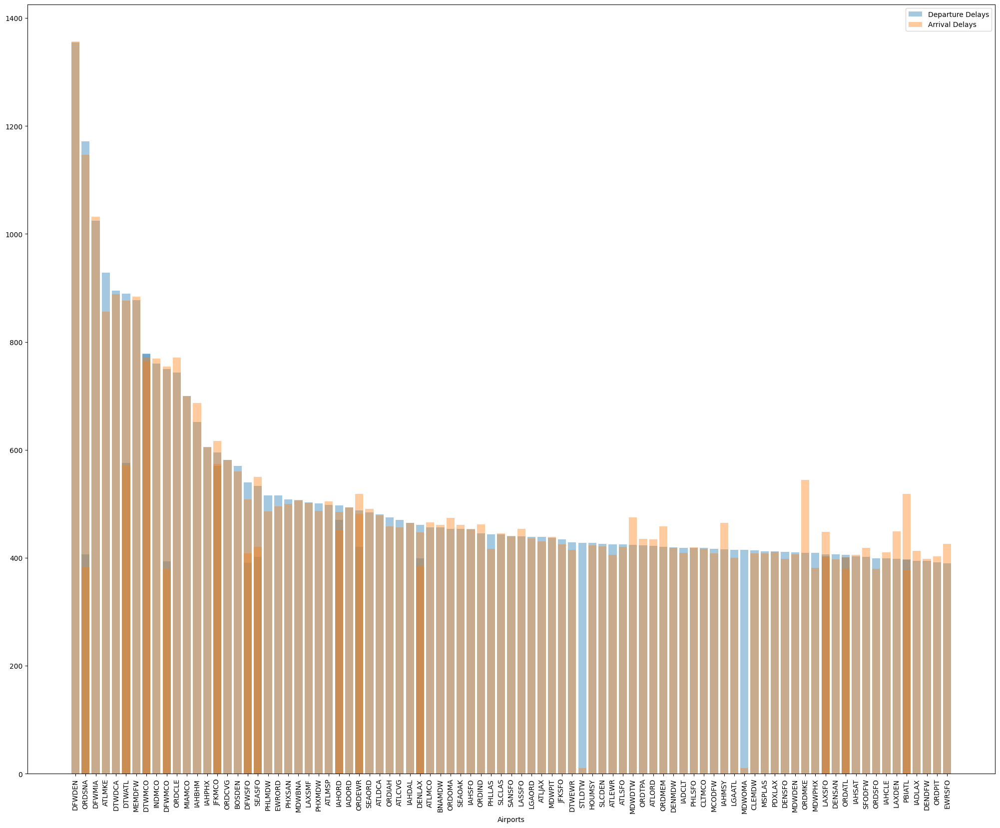

In [ ]:
#Plotting with max departure delays, arrival delays and airroutes
max_dep_delay2=df.nlargest(100,'DepDelay')
plt.figure(figsize=(25,20))
plt.bar(max_dep_delay2['Airports'],max_dep_delay2['DepDelay'],alpha=0.4)
plt.bar(max_dep_delay2['Airports'],max_dep_delay2['ArrDelay'],alpha=0.4)
plt.xticks(rotation=90)
plt.xlabel("Airports")
plt.legend(["Departure Delays", "Arrival Delays"])
plt.show()


#### Checking for weather delays

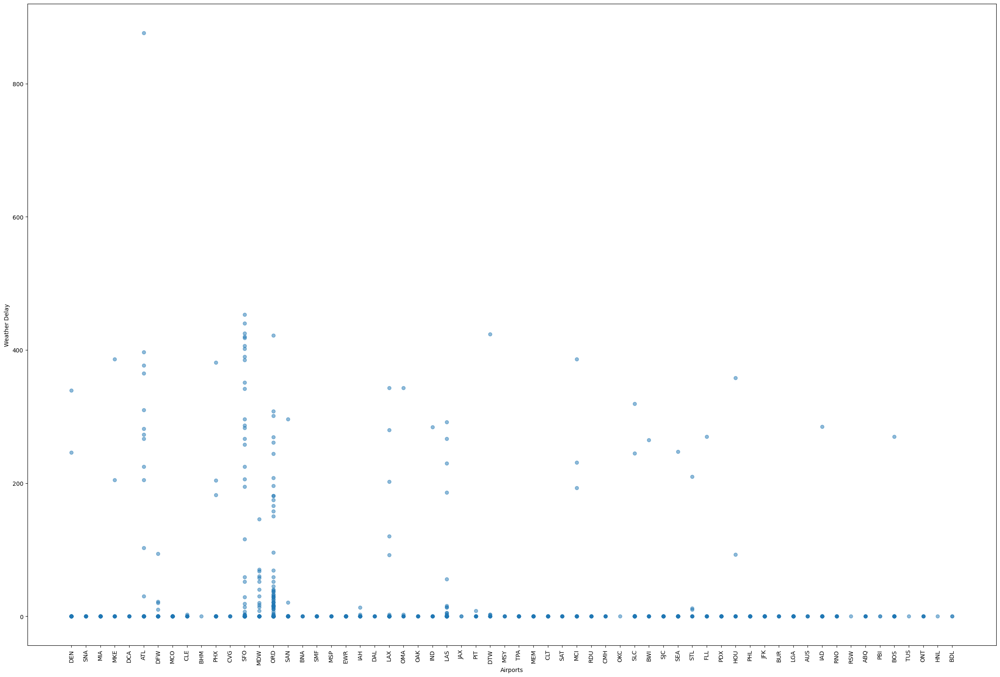

In [ ]:
#Chieking for weather delays in max departure delays data set
plt.figure(figsize=(30,20))

plt.scatter(max_dep_delay["Origin"],max_dep_delay['WeatherDelay'],alpha=0.5)
plt.xticks(rotation=90)
plt.xlabel("Airports")
plt.ylabel("Weather Delay")
plt.show()
print()

####Checking for Late Aircraft Delays

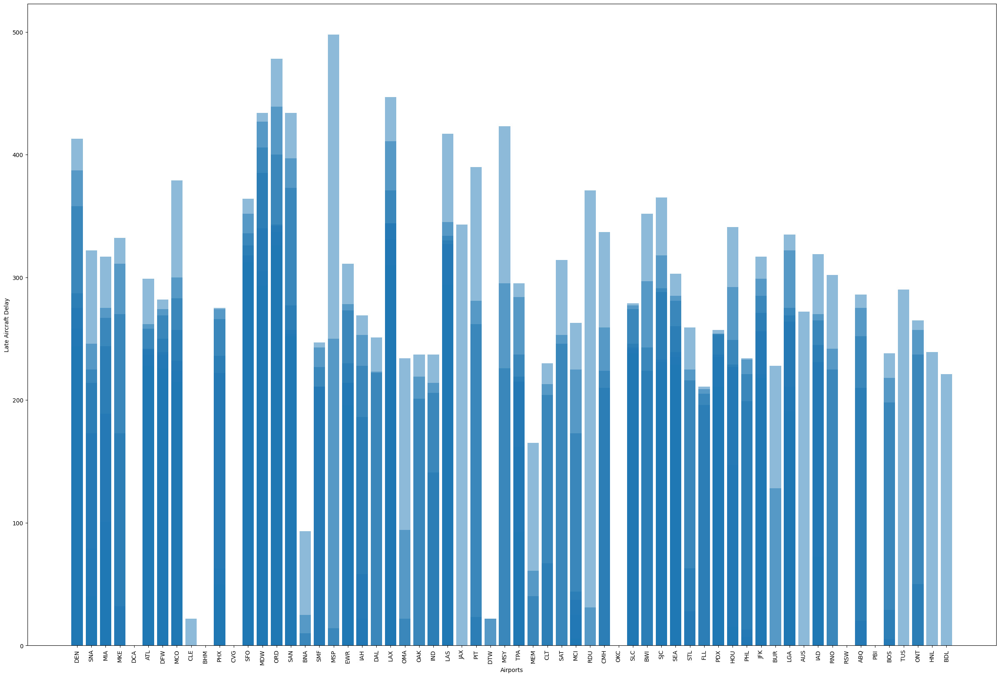

In [ ]:
#Chieking for late aircraft delays in max departure delays data set
plt.figure(figsize=(30,20))

plt.bar(max_dep_delay["Origin"],max_dep_delay['LateAircraftDelay'],alpha=0.5)
plt.xticks(rotation=90)
plt.xlabel("Airports")
plt.ylabel("Late Aircraft Delay")
plt.show()
print()

#### Checking for NAS Delays

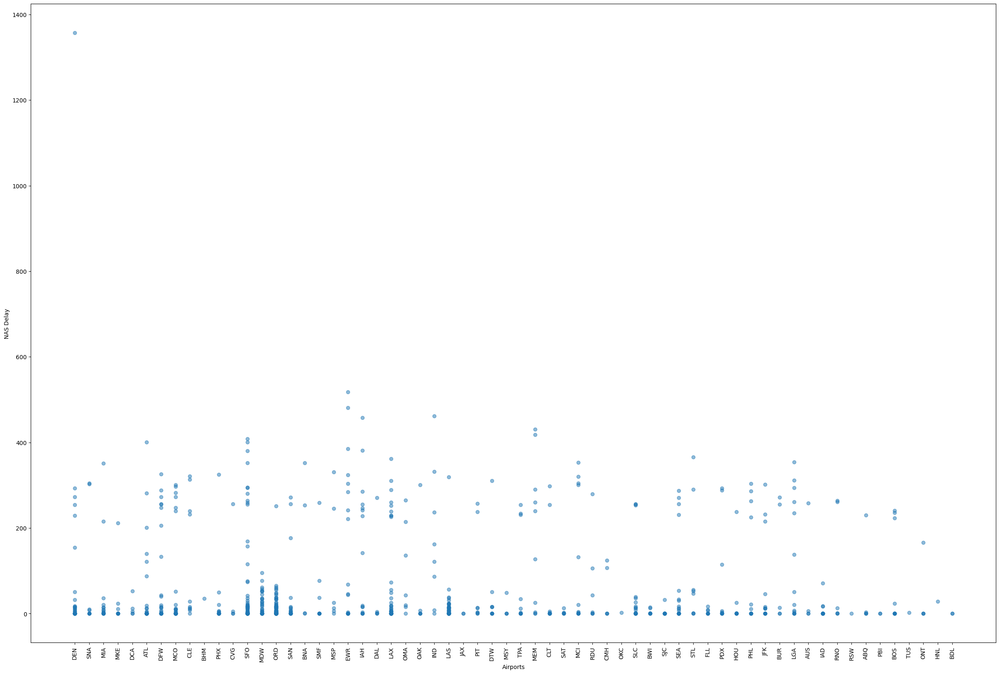

In [ ]:
#Chieking for NAS delays in max departure delays data set
plt.figure(figsize=(30,20))

plt.scatter(max_dep_delay["Origin"],max_dep_delay['NASDelay'],alpha=0.5)
plt.xticks(rotation=90)
plt.xlabel("Airports")
plt.ylabel("NAS Delay")
plt.show()
print()

### Plotting with maximum arrival delays

In [ ]:
#Minimizing the data set to largest 1000 arrival delays
max_arr_delay=df.nlargest(1000,'ArrDelay')

In [ ]:
#Value counts for destinations in max arrival delays
pd.set_option("display.max_rows", None)
print(max_arr_delay["Dest"].value_counts())

ORD    209
SFO     74
ATL     56
LAS     51
LAX     51
DEN     45
DFW     30
IAH     30
EWR     28
SLC     28
PHX     21
SEA     19
MDW     19
JFK     18
BOS     18
MCO     17
CLT     16
PHL     14
MIA     14
LGA     14
PDX     14
CMH     12
SAN     12
SJC     12
IAD     12
DTW      9
BNA      8
MCI      8
FLL      7
OAK      7
MSY      7
BUF      7
CLE      7
MEM      7
MSP      6
TPA      6
HOU      6
BWI      6
STL      6
CVG      4
ONT      4
TUL      4
DCA      4
SMF      4
PIT      4
ABQ      4
RNO      4
SNA      3
SJU      3
SAT      3
MKE      3
IND      3
RDU      3
TUS      2
AUS      2
BDL      2
PBI      2
JAX      2
SDF      2
OMA      2
PVD      1
RSW      1
DAL      1
BUR      1
ELP      1
Name: Dest, dtype: int64


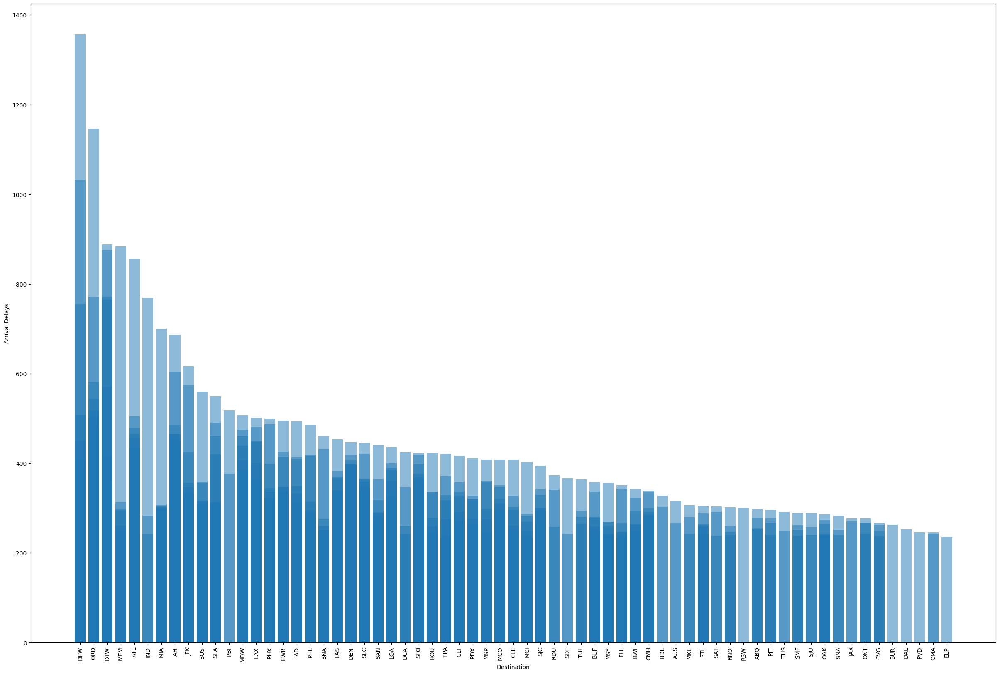

In [ ]:
#plotting destinations vs arrival delays
plt.figure(figsize=(30,20))
plt.bar(max_arr_delay['Dest'],max_arr_delay['ArrDelay'],alpha=0.5)
plt.xticks(rotation=90)
plt.xlabel("Destination")
plt.ylabel("Arrival Delays")
plt.show()

### Plotting with minimum arrival delays

In [ ]:
#taking the least arrival delays (early arrivals)
min_arr_delay=df.nsmallest(1000,'ArrDelay')

In [ ]:
#value counts of destination with early arrivals
pd.set_option("display.max_rows", None)
print(min_arr_delay["Dest"].value_counts())

EWR    102
JFK     77
ATL     76
ORD     68
LAX     68
SFO     67
PHX     60
LAS     55
FLL     51
BOS     42
TPA     33
MCO     25
RDU     23
PHL     22
SEA     21
LGA     21
CLT     20
DEN     19
DCA     18
DFW     17
MSP     16
MIA     15
IAH     15
SJU     10
BWI      8
RSW      7
PBI      6
TUS      6
CVG      6
DTW      5
SAN      3
CMH      3
IAD      3
SLC      2
MKE      2
PIT      2
MDW      2
CLE      1
BUF      1
SNA      1
PDX      1
Name: Dest, dtype: int64


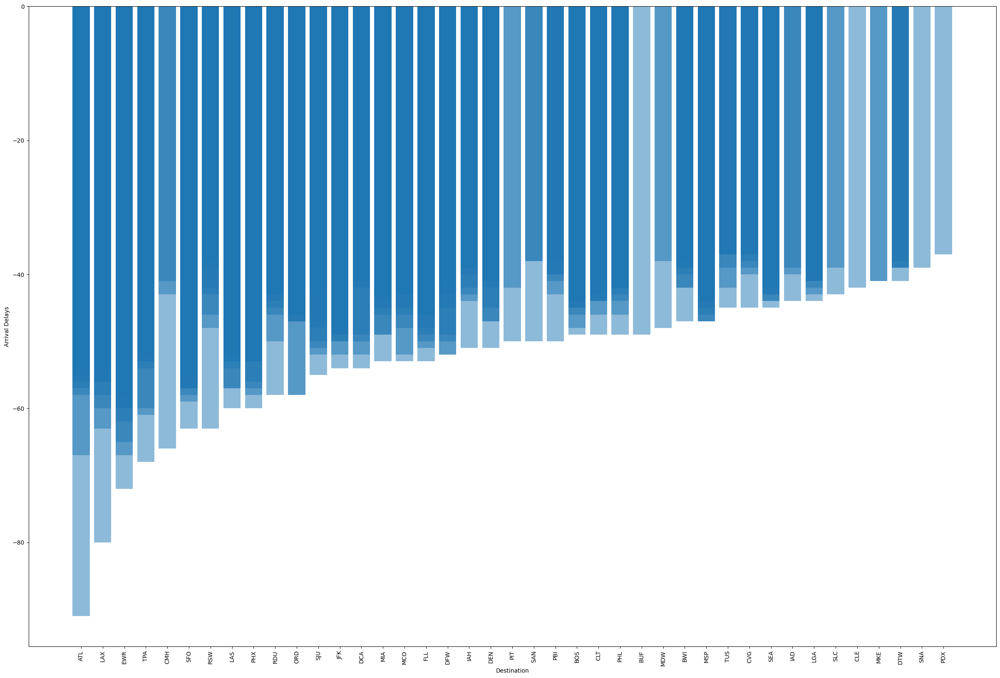

In [ ]:
#plotting destinations vs arrival delays
plt.figure(figsize=(30,20))
plt.bar(min_arr_delay['Dest'],min_arr_delay['ArrDelay'],alpha=0.5)
plt.xticks(rotation=90)
plt.xlabel("Destination")
plt.ylabel("Arrival Delays")
plt.show()

###Checking for relation between airtime and delays using K-means Clustering

#### Maximum Airtime vs delays

In [ ]:
#Taking the airlines with largest airtime
max_air_time=df.nlargest(5000,'AirTime')

In [ ]:
#Airroutes with highest airtimes
pd.set_option("display.max_rows", None)
print(max_air_time["Airports"].value_counts().head(10))

LAXJFK    644
SFOJFK    546
LASJFK    319
LAXIAD    312
LAXEWR    259
SFOIAD    248
JFKSFO    214
LAXMIA    213
LAXBOS    205
SFOEWR    203
Name: Airports, dtype: int64


In [ ]:
#Airports with airlines flying to longer airtime
pd.set_option("display.max_rows", None)
print(max_air_time["Origin"].value_counts())

JFK    1648
PHL     645
EWR     612
IAD     560
BOS     408
SFO     370
ATL     224
MIA     213
LAX     152
HNL     106
BWI      53
ORD       3
CLT       3
LGA       1
PHX       1
MDW       1
Name: Origin, dtype: int64


####K- Means Clustering for Max Airtime

#####Silhouette Method for Airtime vs Departure/Arrival Delays

In [ ]:
#Slhouette Method for Airtime and Departure Delays
dfvalues= max_air_time[['AirTime','DepDelay']].values
silhouette_scores = []
for n_clusters in range(2, 11):
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    kmeans.fit(dfvalues)
    labels = kmeans.labels_
    silhouette_avg = silhouette_score(dfvalues, labels)
    silhouette_scores.append(silhouette_avg)
    print("Silhouette score for", str(n_clusters), "clusters:", round(silhouette_avg,3))
optimal_clusters = np.argmax(silhouette_scores) + 2

print("Optimal number of clusters is",optimal_clusters )
print("Silhouette scores are: ", silhouette_scores)

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 2 clusters: 0.687


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 3 clusters: 0.485


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 4 clusters: 0.503


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 5 clusters: 0.415


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 6 clusters: 0.426


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 7 clusters: 0.446


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 8 clusters: 0.45


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 9 clusters: 0.411


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 10 clusters: 0.425
Optimal number of clusters is 2
Silhouette scores are:  [0.6871763447332697, 0.4847573986206209, 0.5027471213102622, 0.41522725868401883, 0.4257978047828293, 0.4462723516988627, 0.44956323325054875, 0.41095906164859863, 0.42471733591231514]


In [ ]:
#Slhouette Method for Airtime and Departure Delays
dfvalues= max_air_time[['AirTime','ArrDelay']].values
silhouette_scores = []
for n_clusters in range(2, 11):
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    kmeans.fit(dfvalues)
    labels = kmeans.labels_
    silhouette_avg = silhouette_score(dfvalues, labels)
    silhouette_scores.append(silhouette_avg)
    print("Silhouette score for", str(n_clusters), "clusters:", round(silhouette_avg,3))
optimal_clusters = np.argmax(silhouette_scores) + 2

print("Optimal number of clusters is",optimal_clusters )
print("Silhouette scores are: ", silhouette_scores)

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 2 clusters: 0.609


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 3 clusters: 0.38


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 4 clusters: 0.388


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 5 clusters: 0.364


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 6 clusters: 0.356


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 7 clusters: 0.356


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 8 clusters: 0.345


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 9 clusters: 0.343


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 10 clusters: 0.352
Optimal number of clusters is 2
Silhouette scores are:  [0.6085400167385596, 0.38037245526110514, 0.38754364311515294, 0.3636236092535685, 0.35638117797809027, 0.3561731268535267, 0.34469536197221934, 0.34283056910566967, 0.35183447263633344]


#####Elbow Method for Airtime vs Departure/Arrival Delays

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: F

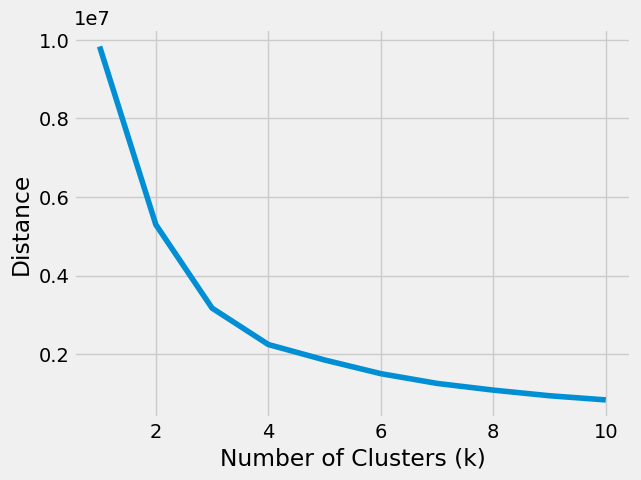

In [ ]:
#Elbow Method for Airtime and Departure Delays
range_n_clusters = [1,2,3,4,5,6,7,8,9,10]
avg_distance=[]
for n_clusters in range_n_clusters:
  clusterer = KMeans(n_clusters=n_clusters, random_state=42).fit(max_air_time[['AirTime','DepDelay']])
  avg_distance.append(clusterer.inertia_)

style.use("fivethirtyeight")
plt.plot(range_n_clusters, avg_distance)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Distance")
plt.show()

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: F

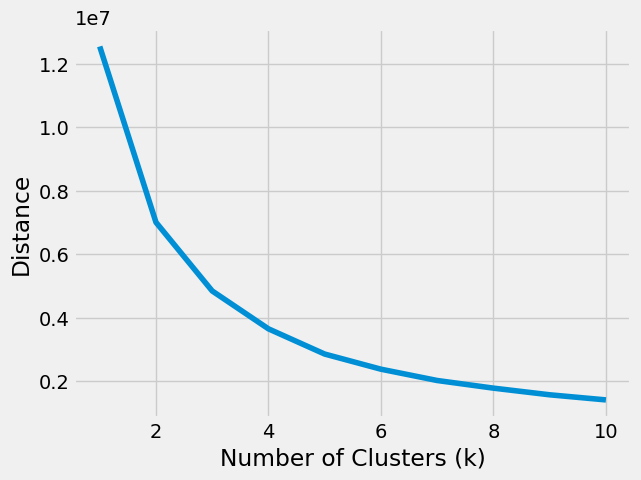

In [ ]:
#Elbow Method for Airtime and Departure Delays
range_n_clusters = [1,2,3,4,5,6,7,8,9,10]
avg_distance=[]
for n_clusters in range_n_clusters:
  clusterer = KMeans(n_clusters=n_clusters, random_state=42).fit(max_air_time[['AirTime','ArrDelay']])
  avg_distance.append(clusterer.inertia_)

style.use("fivethirtyeight")
plt.plot(range_n_clusters, avg_distance)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Distance")
plt.show()

#####Clustering

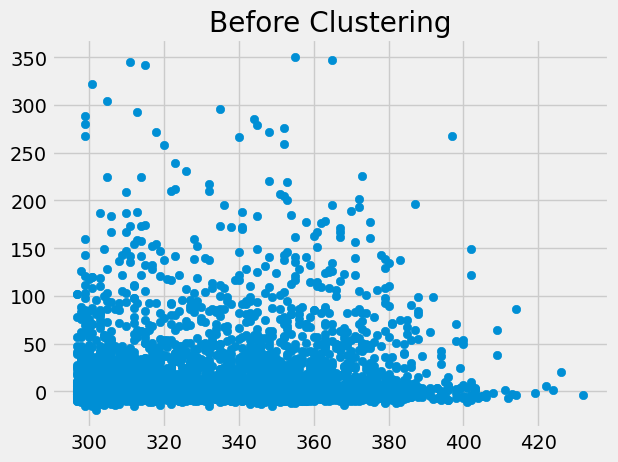

After K means Clustering


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


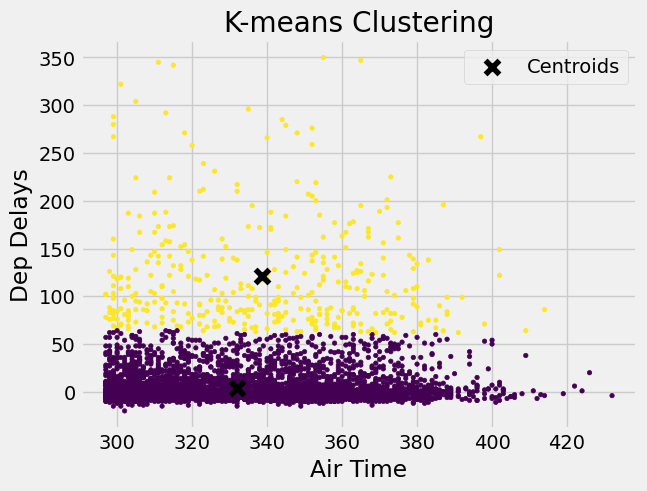

In [ ]:
#Plotting a scatter plot before K means Clustering
plt.scatter(max_air_time['AirTime'], max_air_time['DepDelay'])
plt.title("Before Clustering")
plt.show()

print("After K means Clustering")

# Apply K-means clustering to Airtime and Departure Delays
kmeans = KMeans(n_clusters=2)
kmeans.fit(max_air_time[['AirTime','DepDelay']])
labels = kmeans.labels_
centroids = kmeans.cluster_centers_
plt.scatter(max_air_time['AirTime'], max_air_time['DepDelay'], c=labels, cmap='viridis', s=10)
plt.scatter(centroids[:, 0], centroids[:, 1], c='black', marker='x', s=100, label='Centroids')
plt.xlabel('Air Time')
plt.ylabel('Dep Delays')
plt.title('K-means Clustering')
plt.legend()
plt.show()



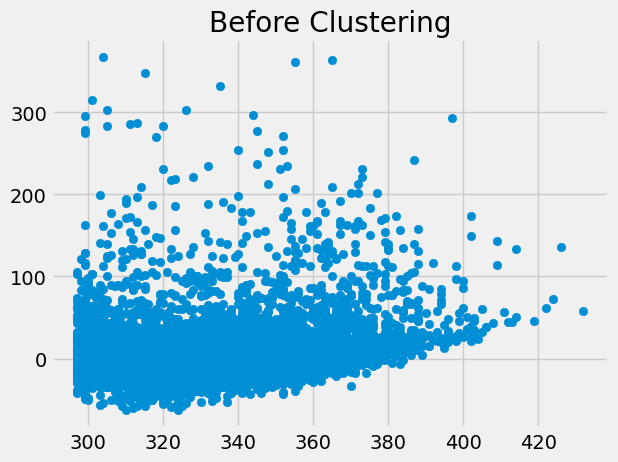

After K means Clustering


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


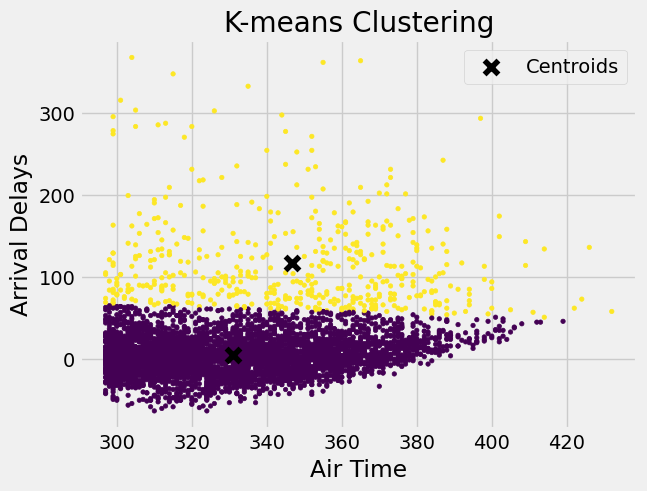

In [ ]:
#Plotting a scatter plot before K means Clustering
plt.scatter(max_air_time['AirTime'], max_air_time['ArrDelay'])
plt.title("Before Clustering")
plt.show()

print("After K means Clustering")

# Apply K-means clustering to Airtime and Arrival delays
kmeans = KMeans(n_clusters=2)
kmeans.fit(max_air_time[['AirTime','ArrDelay']])
labels = kmeans.labels_
centroids = kmeans.cluster_centers_
plt.scatter(max_air_time['AirTime'], max_air_time['ArrDelay'], c=labels, cmap='viridis', s=10)
plt.scatter(centroids[:, 0], centroids[:, 1], c='black', marker='x', s=100, label='Centroids')
plt.xlabel('Air Time')
plt.ylabel('Arrival Delays')
plt.title('K-means Clustering')
plt.legend()
plt.show()



#### Minimum Airtime vs delays

In [ ]:
#Taking the airlines with least air time
min_air_time=df.nsmallest(5000,'AirTime')

In [ ]:
#Airroutes with least air time 
pd.set_option("display.max_rows", None)
print(min_air_time["Airports"].value_counts().head(10))

LAXSAN    765
SANLAX    488
TUSPHX    329
AUSIAH    267
PHXTUS    263
MKEORD    224
AUSHOU    218
ORDMKE    212
RDUCLT    187
BHMATL    180
Name: Airports, dtype: int64


In [ ]:
pd.set_option("display.max_rows", None)
print(min_air_time["Origin"].value_counts().head(10))

SAN    765
LAX    488
PHX    331
ORD    329
IAH    269
TUS    263
AUS    246
HOU    219
MKE    213
SFO    209
Name: Origin, dtype: int64


####K- Means Clustering for Min Airtime

#####Silhouette Method for Airtime vs Arrival/Departure Delays

In [ ]:
#Silhouette method for AirTIme and Departure Delays
dfvalues= min_air_time[['AirTime','DepDelay']].values
silhouette_scores = []
for n_clusters in range(2, 11):
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    kmeans.fit(dfvalues)
    labels = kmeans.labels_
    silhouette_avg = silhouette_score(dfvalues, labels)
    silhouette_scores.append(silhouette_avg)
    print("Silhouette score for", str(n_clusters), "clusters:", round(silhouette_avg,3))
optimal_clusters = np.argmax(silhouette_scores) + 2

print("Optimal number of clusters is",optimal_clusters )
print("Silhouette scores are: ", silhouette_scores)

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 2 clusters: 0.834


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 3 clusters: 0.771


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 4 clusters: 0.753


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 5 clusters: 0.709


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 6 clusters: 0.644


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 7 clusters: 0.612


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 8 clusters: 0.606


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 9 clusters: 0.55


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 10 clusters: 0.441
Optimal number of clusters is 2
Silhouette scores are:  [0.8344578205861357, 0.7710518615432629, 0.7531048663846732, 0.7088442391256985, 0.6440276595790305, 0.6116122780601314, 0.6058975254112765, 0.5496450420336855, 0.4409487787407681]


In [ ]:
#Silhouette method for AirTIme and Arrival Delays
dfvalues= min_air_time[['AirTime','ArrDelay']].values
silhouette_scores = []
for n_clusters in range(2, 11):
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    kmeans.fit(dfvalues)
    labels = kmeans.labels_
    silhouette_avg = silhouette_score(dfvalues, labels)
    silhouette_scores.append(silhouette_avg)
    print("Silhouette score for", str(n_clusters), "clusters:", round(silhouette_avg,3))
optimal_clusters = np.argmax(silhouette_scores) + 2

print("Optimal number of clusters is",optimal_clusters )
print("Silhouette scores are: ", silhouette_scores)

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 2 clusters: 0.809


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 3 clusters: 0.702


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 4 clusters: 0.692


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 5 clusters: 0.575


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 6 clusters: 0.524


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 7 clusters: 0.426


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 8 clusters: 0.421


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 9 clusters: 0.419


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score for 10 clusters: 0.398
Optimal number of clusters is 2
Silhouette scores are:  [0.8089773327293207, 0.7016151353471561, 0.6919320955429484, 0.5748639648400132, 0.5235741810362134, 0.42583854935583404, 0.42098830712708823, 0.41877564977348614, 0.39785249940410317]


##### Elbow Method for Airtime vs Departure/Arrival Delays

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: F

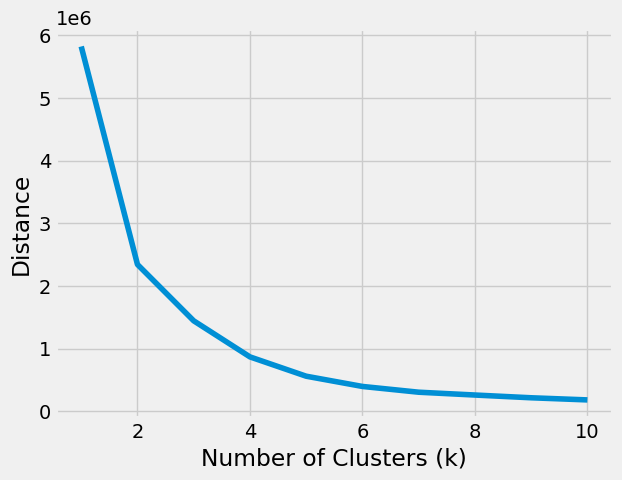

In [ ]:
#Elbow method for AirTime and Departure Delays
range_n_clusters = [1,2,3,4,5,6,7,8,9,10]
avg_distance=[]
for n_clusters in range_n_clusters:
  clusterer = KMeans(n_clusters=n_clusters, random_state=42).fit(min_air_time[['AirTime','DepDelay']])
  avg_distance.append(clusterer.inertia_)

style.use("fivethirtyeight")
plt.plot(range_n_clusters, avg_distance)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Distance")
plt.show()

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: F

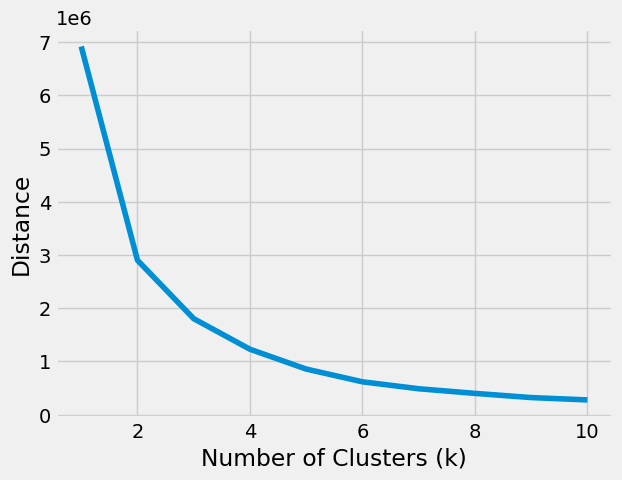

In [ ]:
#Silhouette method for AirTime and Arrival Delays
range_n_clusters = [1,2,3,4,5,6,7,8,9,10]
avg_distance=[]
for n_clusters in range_n_clusters:
  clusterer = KMeans(n_clusters=n_clusters, random_state=42).fit(min_air_time[['AirTime','ArrDelay']])
  avg_distance.append(clusterer.inertia_)

style.use("fivethirtyeight")
plt.plot(range_n_clusters, avg_distance)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Distance")
plt.show()

#####Clustering

######Clustering with Departure Delays

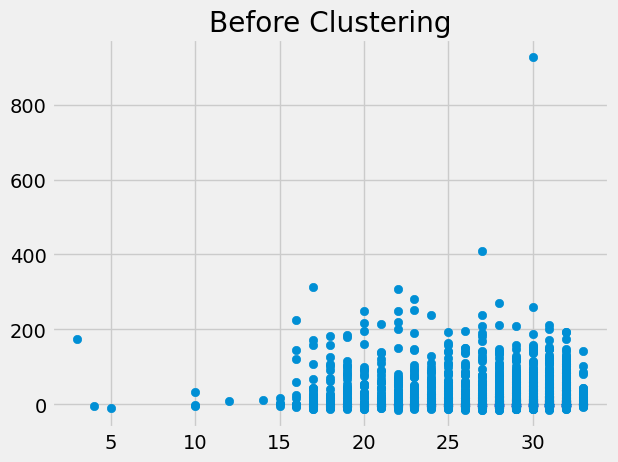

After K means Clustering


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


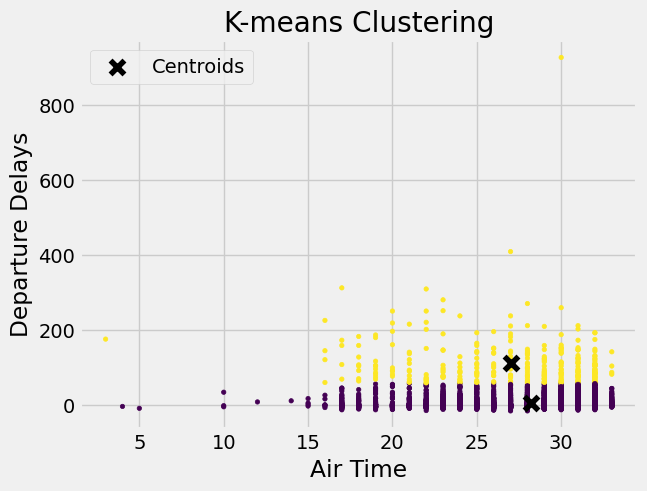

In [ ]:
#Plotting scatterplot before clustering with minimum airtime and departure delays
plt.scatter(min_air_time['AirTime'], min_air_time['DepDelay'])
plt.title("Before Clustering")
plt.show()

print("After K means Clustering")

# Apply K-means clustering for airlines with minimum airtime and departure delays
kmeans = KMeans(n_clusters=2)
kmeans.fit(min_air_time[['AirTime','DepDelay']])
labels = kmeans.labels_
centroids = kmeans.cluster_centers_
plt.scatter(min_air_time['AirTime'], min_air_time['DepDelay'], c=labels, cmap='viridis', s=10)
plt.scatter(centroids[:, 0], centroids[:, 1], c='black', marker='x', s=100, label='Centroids')
plt.xlabel('Air Time')
plt.ylabel('Departure Delays')
plt.title('K-means Clustering')
plt.legend()
plt.show()



######Clustering with Arrival Delays

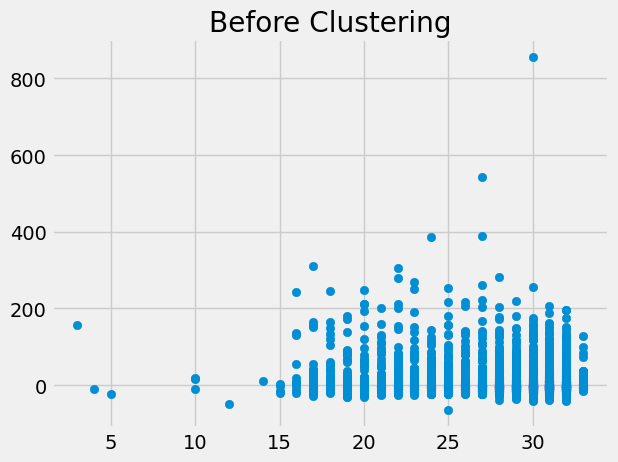

After K means Clustering


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


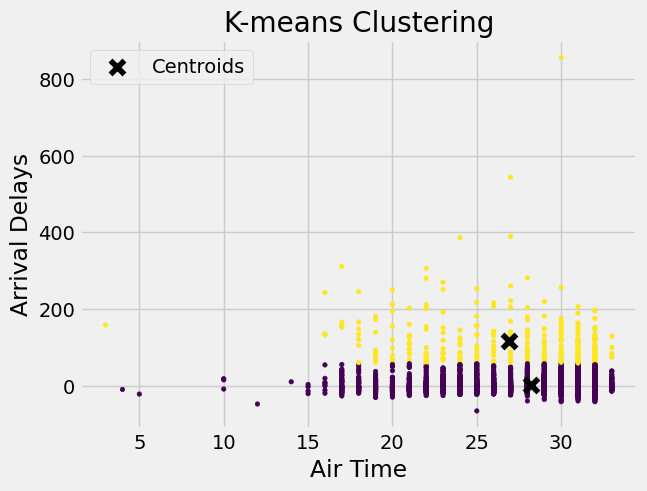

In [ ]:
#Plotting scatterplot before clustering with minimum airtime and departure delays
plt.scatter(min_air_time['AirTime'], min_air_time['ArrDelay'])
plt.title("Before Clustering")
plt.show()

print("After K means Clustering")

# Apply K-means clustering for airlines with minimum airtime and departure delays
kmeans = KMeans(n_clusters=2)
kmeans.fit(min_air_time[['AirTime','ArrDelay']])
labels = kmeans.labels_
centroids = kmeans.cluster_centers_
plt.scatter(min_air_time['AirTime'], min_air_time['ArrDelay'], c=labels, cmap='viridis', s=10)
plt.scatter(centroids[:, 0], centroids[:, 1], c='black', marker='x', s=100, label='Centroids')
plt.xlabel('Air Time')
plt.ylabel('Arrival Delays')
plt.title('K-means Clustering')
plt.legend()
plt.show()



###Analyzing Delays w.r.t Days of week and month

In [ ]:
#Average number of overall departure delays sorted w.r.t week day
mean_df3=df[['DepDelay','ArrDelay','AirTime','DayOfWeek','DayofMonth']].copy()
mean_df3.groupby('DayOfWeek').mean().sort_values(['DepDelay'],ascending=False)

,DepDelay,ArrDelay,AirTime,DayofMonth
DayOfWeek,,,,
4.0,14.905204,14.909754,103.974731,16.549512
7.0,14.394031,12.111485,104.065124,15.739233
5.0,13.277501,12.168171,103.983792,14.360003
1.0,12.892470,11.553353,102.775520,16.797179
2.0,12.153432,11.316834,104.210210,14.694422
3.0,10.113625,8.203512,102.864014,15.505558
6.0,9.448962,6.225502,106.851314,15.153009


In [ ]:
#Average number of overall departure delays sorted w.r.t day of the month
mean_df3.groupby('DayofMonth').mean().sort_values(['DepDelay'],ascending=False)

,DepDelay,ArrDelay,AirTime,DayOfWeek
DayofMonth,,,,
31.0,22.687853,26.285194,106.749195,4.000000
27.0,22.328129,22.207566,106.874625,7.000000
2.0,21.506602,19.760828,104.516190,3.049840
3.0,20.467833,18.389955,100.755091,4.465810
21.0,19.389625,20.536141,105.400037,1.000000
17.0,19.117348,20.471741,104.827828,4.000000
1.0,19.071635,18.084456,107.928012,2.000000
5.0,18.551022,16.585923,102.370740,5.214533
4.0,18.434911,16.647467,99.976254,4.313739


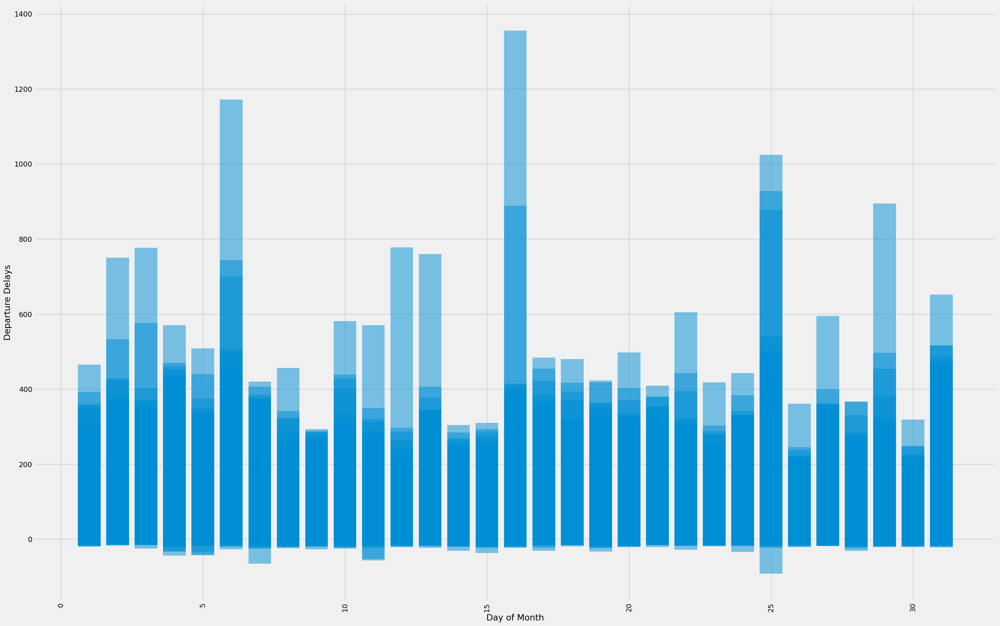

In [ ]:
#Plotting Departure delays w.r.t Day of Month
plt.figure(figsize=(30,20))
plt.bar(df['DayofMonth'],df['DepDelay'],alpha=0.5)
plt.xticks(rotation=90)
plt.xlabel("Day of Month")
plt.ylabel("Departure Delays")
plt.show()

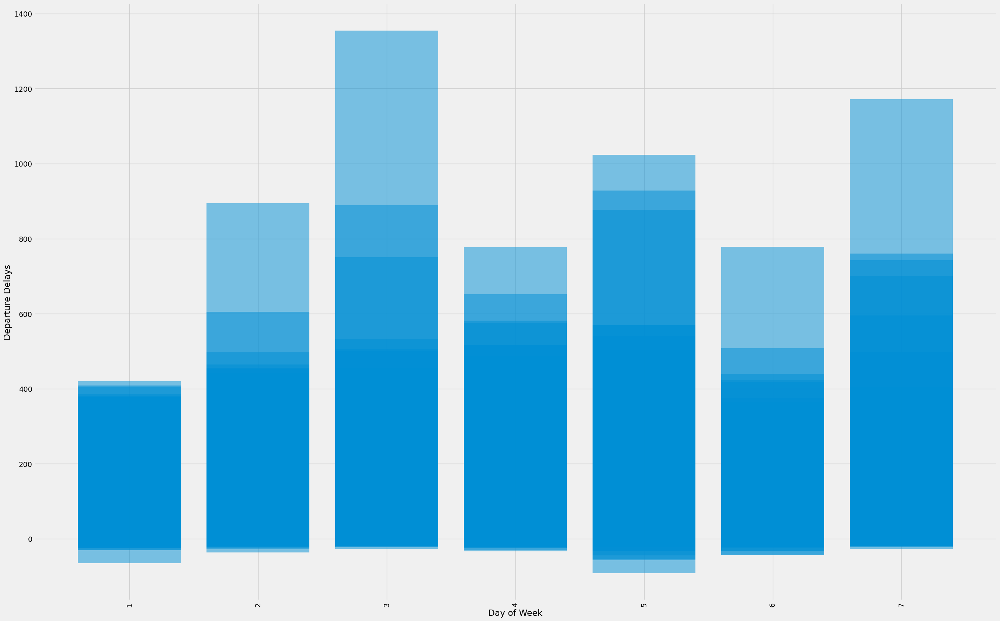

In [ ]:
#Plotting Departure delays w.r.t Day of Week
plt.figure(figsize=(30,20))
plt.bar(df['DayOfWeek'],df['DepDelay'],alpha=0.5)
plt.xticks(rotation=90)
plt.xlabel("Day of Week")
plt.ylabel("Departure Delays")
plt.show()

####Analyzing with minimum departure delays

In [ ]:
mean_df4=min_dep_delay[['DepDelay','ArrDelay','AirTime','DayOfWeek','DayofMonth']].copy()
#Average number of departure delays sorted w.r.t day of the week
mean_df4.groupby('DayOfWeek').mean().sort_values(['DepDelay'],ascending=True)

,DepDelay,ArrDelay,AirTime,DayofMonth
DayOfWeek,,,,
5.0,-17.391753,-13.350515,99.484536,13.886598
1.0,-16.092857,-15.514286,100.235714,16.350000
6.0,-15.515152,-18.315152,101.478788,16.157576
4.0,-15.461538,-9.307692,116.023077,17.484615
2.0,-15.367816,-15.218391,105.413793,16.689655
3.0,-15.028571,-12.074286,107.428571,18.360000
7.0,-14.957983,-12.117647,107.445378,16.470588


In [ ]:
#Average number of departure delays sorted w.r.t day of the month
mean_df4.groupby('DayofMonth').mean().sort_values(['DepDelay'],ascending=False)

,DepDelay,ArrDelay,AirTime,DayOfWeek
DayofMonth,,,,
6.0,364.095238,347.042468,106.913649,5.000000
16.0,352.407407,358.518519,96.444444,3.000000
12.0,350.000000,339.500000,104.666667,6.000000
25.0,336.068182,338.477273,84.636364,5.000000
10.0,330.500000,307.170845,92.941902,4.000000
13.0,326.555556,318.944444,169.388889,7.000000
20.0,325.200000,320.000000,107.100000,7.000000
2.0,322.160000,313.160000,122.280000,3.000000
24.0,314.615385,310.384615,117.307692,4.000000


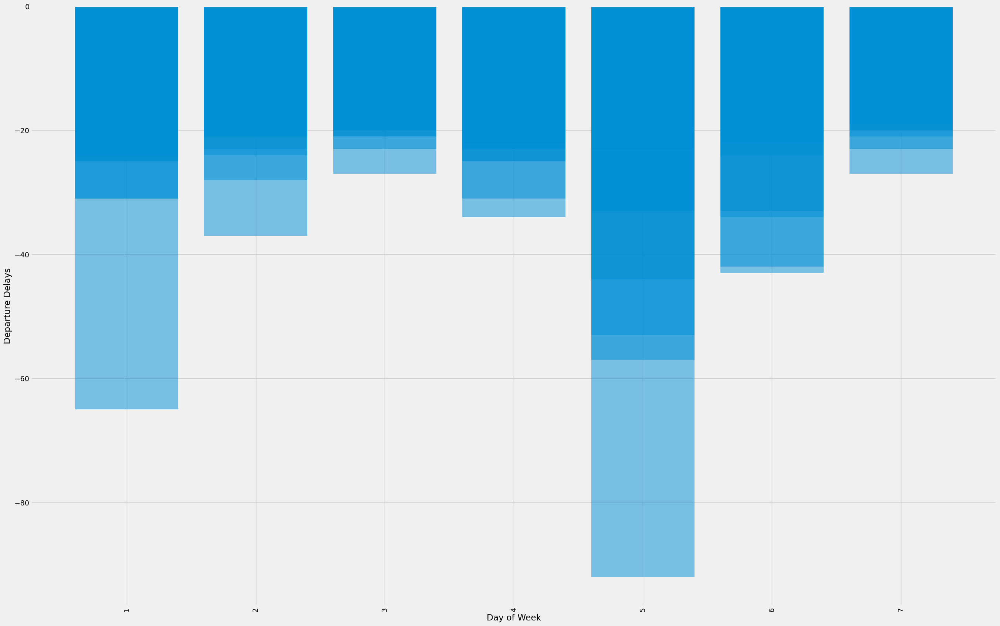

In [ ]:
#plotting day of the week w.r.t maximum number of departure delays
plt.figure(figsize=(30,20))
plt.bar(min_dep_delay['DayOfWeek'],min_dep_delay['DepDelay'],alpha=0.5)
plt.xticks(rotation=90)
plt.xlabel("Day of Week")
plt.ylabel("Departure Delays")
plt.show()

####Analyzing with maximum departure delays

In [ ]:
#Taking to maximum number of delays and finding their averages
mean_df4=max_dep_delay[['DepDelay','ArrDelay','AirTime','DayOfWeek','DayofMonth']].copy()
#Average number of departure delays sorted w.r.t day of the month
mean_df4.groupby('DayOfWeek').mean().sort_values(['DepDelay'],ascending=False)

,DepDelay,ArrDelay,AirTime,DayofMonth
DayOfWeek,,,,
3.0,324.980583,318.314484,106.924142,10.902913
5.0,312.337278,311.866224,123.640158,11.745562
4.0,297.259912,302.492439,114.618384,22.581498
6.0,294.051948,289.415584,117.584416,10.727273
7.0,290.859649,284.480558,98.406783,16.502924
2.0,285.017391,286.203407,116.036405,16.565217
1.0,273.166667,273.370837,107.322898,15.695652


In [ ]:
#Average number of departure delays sorted w.r.t day of the month
mean_df4.groupby('DayofMonth').mean().sort_values(['DepDelay'],ascending=False)

,DepDelay,ArrDelay,AirTime,DayOfWeek
DayofMonth,,,,
6.0,364.095238,347.042468,106.913649,5.000000
16.0,352.407407,358.518519,96.444444,3.000000
12.0,350.000000,339.500000,104.666667,6.000000
25.0,336.068182,338.477273,84.636364,5.000000
10.0,330.500000,307.170845,92.941902,4.000000
13.0,326.555556,318.944444,169.388889,7.000000
20.0,325.200000,320.000000,107.100000,7.000000
2.0,322.160000,313.160000,122.280000,3.000000
24.0,314.615385,310.384615,117.307692,4.000000
